Anisha Thakrar, Poojan Thakkar, Uthresh Hariharakrishnan

In [1]:
import pandas as pd
import numpy as np
import json
import os
import random
import nltk
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.style as style
import ipywidgets as widgets
import seaborn as sns
import pickle
import string
import re
import bokeh
import warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import silhouette_samples, silhouette_score
from IPython.display import clear_output, display
from tqdm import tqdm
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from pprint import pprint
from langdetect import detect
from langdetect import DetectorFactory
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score
from sklearn import metrics
from scipy.spatial.distance import cdist
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer 
from nltk.stem import WordNetLemmatizer

from plot_text import header, description, description2, cite, description_search, description_slider, notes, dataset_description, toolbox_header 
from call_backs import input_callback, selected_code
from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper, CustomJS, Slider, TapTool, TextInput
from bokeh.palettes import Category20
from bokeh.transform import linear_cmap, transform
from bokeh.io import output_file, show, output_notebook
from bokeh.plotting import figure
from bokeh.models import RadioButtonGroup, TextInput, Div, Paragraph
from bokeh.layouts import column, widgetbox, row, layout
from bokeh.layouts import column

In [3]:
root_path = 'data/'
metadata_path = f'{root_path}/metadata.csv'
meta_df = pd.read_csv(metadata_path, dtype={
    'pubmed_id': str,
    'Microsoft Academic Paper ID': str, 
    'doi': str
})
meta_df.head()

,cord_uid,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,mag_id,who_covidence_id,arxiv_id,pdf_json_files,pmc_json_files,url,s2_id
0,ug7v899j,d1aafb70c066a2068b02786f8929fd9c900897fb,PMC,Clinical features of culture-proven Mycoplasma...,10.1186/1471-2334-1-6,PMC35282,11472636,no-cc,OBJECTIVE: This retrospective chart review des...,2001-07-04,"Madani, Tariq A; Al-Ghamdi, Aisha A",BMC Infect Dis,NaN,NaN,NaN,document_parses/pdf_json/d1aafb70c066a2068b027...,document_parses/pmc_json/PMC35282.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3...,NaN
1,02tnwd4m,6b0567729c2143a66d737eb0a2f63f2dce2e5a7d,PMC,Nitric oxide: a pro-inflammatory mediator in l...,10.1186/rr14,PMC59543,11667967,no-cc,Inflammatory diseases of the respiratory tract...,2000-08-15,"Vliet, Albert van der; Eiserich, Jason P; Cros...",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/6b0567729c2143a66d737...,document_parses/pmc_json/PMC59543.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
2,ejv2xln0,06ced00a5fc04215949aa72528f2eeaae1d58927,PMC,Surfactant protein-D and pulmonary host defense,10.1186/rr19,PMC59549,11667972,no-cc,Surfactant protein-D (SP-D) participates in th...,2000-08-25,"Crouch, Erika C",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/06ced00a5fc04215949aa...,document_parses/pmc_json/PMC59549.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
3,2b73a28n,348055649b6b8cf2b9a376498df9bf41f7123605,PMC,Role of endothelin-1 in lung disease,10.1186/rr44,PMC59574,11686871,no-cc,Endothelin-1 (ET-1) is a 21 amino acid peptide...,2001-02-22,"Fagan, Karen A; McMurtry, Ivan F; Rodman, David M",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/348055649b6b8cf2b9a37...,document_parses/pmc_json/PMC59574.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
4,9785vg6d,5f48792a5fa08bed9f56016f4981ae2ca6031b32,PMC,Gene expression in epithelial cells in respons...,10.1186/rr61,PMC59580,11686888,no-cc,Respiratory syncytial virus (RSV) and pneumoni...,2001-05-11,"Domachowske, Joseph B; Bonville, Cynthia A; Ro...",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/5f48792a5fa08bed9f560...,document_parses/pmc_json/PMC59580.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN


In [89]:
path_to_json = 'data/document_parses/pdf_json/'
json_files = [pos_json for pos_json in os.listdir(path_to_json) if pos_json.endswith('.json')]
print(json_files[:10])

['206d0c3d56c51c351d061958ff3ad5bb77bc6fe8.json', '8d4f8c9619197873379885a7b992e25ede17d112.json', '3a0e31effaa0cacb69291fe2f9908316904465d8.json', '16b3c96c27a11b8b329535fcaaaeda45ab4d40c3.json', 'c012c9b7498ba553a710a01fe8dcce9ece33625b.json', '8ef6b31ac51e4560b97074574711f05a2a30c845.json', 'a4fb1ba5d57a944101078281b730b9e17831b3c8.json', '961a8c83162d7b30efe7ace4fa0dc77e55207062.json', '88f8346a3e1b6e61f81ee97593940073344f951c.json', 'e2c6f8343389f96ae3619e302e12ce80934934a9.json']


In [90]:
all_json = [path_to_json + s for s in json_files]
all_json[:5]

['data/document_parses/pdf_json/206d0c3d56c51c351d061958ff3ad5bb77bc6fe8.json',
 'data/document_parses/pdf_json/8d4f8c9619197873379885a7b992e25ede17d112.json',
 'data/document_parses/pdf_json/3a0e31effaa0cacb69291fe2f9908316904465d8.json',
 'data/document_parses/pdf_json/16b3c96c27a11b8b329535fcaaaeda45ab4d40c3.json',
 'data/document_parses/pdf_json/c012c9b7498ba553a710a01fe8dcce9ece33625b.json']

In [91]:
class FileReader:
    def __init__(self, file_path):
        with open(file_path) as file:
            content = json.load(file)
            self.paper_id = content['paper_id']
            self.abstract = []
            self.body_text = []
            # Abstract
            for entry in content['abstract']:
                self.abstract.append(entry['text'])
            # Body text
            for entry in content['body_text']:
                self.body_text.append(entry['text'])
            self.abstract = '\n'.join(self.abstract)
            self.body_text = '\n'.join(self.body_text)
    def __repr__(self):
        return f'{self.paper_id}: {self.abstract[:200]}... {self.body_text[:200]}...'
first_row = FileReader(all_json[0])
print(first_row)

206d0c3d56c51c351d061958ff3ad5bb77bc6fe8: caused by severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2). This disease can impact the cardiovascular system and lead to abnormal electrocardiographic (ECG) findings.
Emergency clinicians... In December 2019, an outbreak of a lower respiratory tract disease caused by the severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2) was first reported in Wuhan, China (1). This was subsequen...


In [92]:
all_json_clean = list()
for idx, entry in tqdm(enumerate(all_json), total=len(all_json)):
    
    try:
        content = FileReader(entry)
    except Exception as e:
        continue  # invalid paper format, skip
    
    if len(content.body_text) == 0:
        continue
    
    all_json_clean.append(all_json[idx])
    
all_json = all_json_clean
len(all_json)

100%|██████████| 292223/292223 [29:42<00:00, 163.91it/s]


292223

In [93]:
random.seed(42)
all_json = random.sample(all_json, 15000)

In [94]:
all_json[:5]

['data/document_parses/pdf_json/3cf1460c7b606755ef713df7450f74388c5bea5c.json',
 'data/document_parses/pdf_json/65790e7fd211156e3dfb365e532fb1d546abf3d3.json',
 'data/document_parses/pdf_json/2a2f19ab63a5b36e0da1c739a261b677c555bf45.json',
 'data/document_parses/pdf_json/72220a24d61a255088d4261c57efcfeca4794689.json',
 'data/document_parses/pdf_json/c5345674d27a04de676fdd7b56ad51e1a8d09349.json']

In [95]:
def get_breaks(content, length):
    data = ""
    words = content.split(' ')
    total_chars = 0

    # add break every length characters
    for i in range(len(words)):
        total_chars += len(words[i])
        if total_chars > length:
            data = data + "<br>" + words[i]
            total_chars = 0
        else:
            data = data + " " + words[i]
    return data

### Loading data

In [96]:
dict_ = {'paper_id': [], 'doi':[], 'abstract': [], 'body_text': [], 'authors': [], 'title': [], 'journal': [], 'abstract_summary': []}
for idx, entry in tqdm(enumerate(all_json), total = len(all_json)):
    
    try:
        content = FileReader(entry)
    except Exception as e:
        continue  # invalid paper format, skip
    
    # get metadata information
    meta_data = meta_df.loc[meta_df['sha'] == content.paper_id]
    # no metadata, skip this paper
    if len(meta_data) == 0:
        continue
    if len(content.body_text) == 0:
        continue
    dict_['abstract'].append(content.abstract)
    dict_['paper_id'].append(content.paper_id)
    dict_['body_text'].append(content.body_text)
    
    # also create a column for the summary of abstract to be used in a plot
    if len(content.abstract) == 0: 
        # no abstract provided
        dict_['abstract_summary'].append("Not provided.")
    elif len(content.abstract.split(' ')) > 100:
        # abstract provided is too long for plot, take first 300 words append with ...
        info = content.abstract.split(' ')[:100]
        summary = get_breaks(' '.join(info), 40)
        dict_['abstract_summary'].append(summary + "...")
    else:
        # abstract is short enough
        summary = get_breaks(content.abstract, 40)
        dict_['abstract_summary'].append(summary)
        
    # get metadata information
    meta_data = meta_df.loc[meta_df['sha'] == content.paper_id]
    
    try:
        # if more than one author
        authors = meta_data['authors'].values[0].split(';')
        if len(authors) > 2:
            # more than 2 authors, may be problem when plotting, so take first 2 append with ...
            dict_['authors'].append(get_breaks('. '.join(authors), 40))
        else:
            # authors will fit in plot
            dict_['authors'].append(". ".join(authors))
    except Exception as e:
        # if only one author - or Null valie
        dict_['authors'].append(meta_data['authors'].values[0])
    
    # add the title information, add breaks when needed
    try:
        title = get_breaks(meta_data['title'].values[0], 40)
        dict_['title'].append(title)
    # if title was not provided
    except Exception as e:
        dict_['title'].append(meta_data['title'].values[0])
    
    # add the journal information
    dict_['journal'].append(meta_data['journal'].values[0])
    
    # add doi
    dict_['doi'].append(meta_data['doi'].values[0])
    
df_covid = pd.DataFrame(dict_, columns=['paper_id', 'doi', 'abstract', 'body_text', 'authors', 'title', 'journal', 'abstract_summary'])
df_covid.head()

100%|██████████| 15000/15000 [12:22<00:00, 20.21it/s]


,paper_id,doi,abstract,body_text,authors,title,journal,abstract_summary
0,65790e7fd211156e3dfb365e532fb1d546abf3d3,10.1016/j.frl.2020.101647,Highlights\nThe exploration of the cryptocurre...,"Nowadays, the COVID-19, which is a part of the...","Mnif, Emna. Jarboui, Anis. Mouakhar,<br>Kha...",How the cryptocurrency market has performed<b...,Financ Res Lett,Highlights\nThe exploration of the<br>cryptoc...
1,72220a24d61a255088d4261c57efcfeca4794689,NaN,We consider a game for a continuum of non-iden...,"With the recent pandemic of COVID-19, the impo...","Aurell, Alexander. Carmona, Rene. Dayanikli...",Finite State Graphon Games with Applications<...,NaN,We consider a game for a continuum of<br>non-...
2,c5345674d27a04de676fdd7b56ad51e1a8d09349,10.1155/2021/6660930,is meta-analysis aims to screen the risk facto...,e novel coronavirus pneumonia (COVID-19) refer...,"Du, Pengqiang. Li, Dandan. Wang, Aifeng. S...",A Systematic Review and Meta-Analysis of Risk...,Can J Infect Dis Med Microbiol,is meta-analysis aims to screen the risk<br>f...
3,f87a921fe6984953634356b5cd895cc43dbdd2c9,NaN,We aim to renew interest in a particular multi...,Recent works have made great progress in singl...,"Pang, Richard Yuanzhe. Lelkes, Adam D.. Tra...",AgreeSum: Agreement-Oriented<br>Multi-Documen...,NaN,We aim to renew interest in a particular<br>m...
4,03c5a4e6ab1d946874c747f5885475d6e45ced5c,10.1093/femspd/ftaa046,Influenza virus and coronaviruses continue to ...,It is generally thought that the first large o...,"Makarov, Vadim. Riabova, Olga. Ekins, Sean....","The past, present and future of RNA respirato...",Pathog Dis,Influenza virus and coronaviruses continue to...


In [97]:
df_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13177 entries, 0 to 13176
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   paper_id          13177 non-null  object
 1   doi               12658 non-null  object
 2   abstract          13177 non-null  object
 3   body_text         13177 non-null  object
 4   authors           13069 non-null  object
 5   title             13177 non-null  object
 6   journal           11863 non-null  object
 7   abstract_summary  13177 non-null  object
dtypes: object(8)
memory usage: 823.7+ KB


In [98]:
df_covid.head()

,paper_id,doi,abstract,body_text,authors,title,journal,abstract_summary
0,65790e7fd211156e3dfb365e532fb1d546abf3d3,10.1016/j.frl.2020.101647,Highlights\nThe exploration of the cryptocurre...,"Nowadays, the COVID-19, which is a part of the...","Mnif, Emna. Jarboui, Anis. Mouakhar,<br>Kha...",How the cryptocurrency market has performed<b...,Financ Res Lett,Highlights\nThe exploration of the<br>cryptoc...
1,72220a24d61a255088d4261c57efcfeca4794689,NaN,We consider a game for a continuum of non-iden...,"With the recent pandemic of COVID-19, the impo...","Aurell, Alexander. Carmona, Rene. Dayanikli...",Finite State Graphon Games with Applications<...,NaN,We consider a game for a continuum of<br>non-...
2,c5345674d27a04de676fdd7b56ad51e1a8d09349,10.1155/2021/6660930,is meta-analysis aims to screen the risk facto...,e novel coronavirus pneumonia (COVID-19) refer...,"Du, Pengqiang. Li, Dandan. Wang, Aifeng. S...",A Systematic Review and Meta-Analysis of Risk...,Can J Infect Dis Med Microbiol,is meta-analysis aims to screen the risk<br>f...
3,f87a921fe6984953634356b5cd895cc43dbdd2c9,NaN,We aim to renew interest in a particular multi...,Recent works have made great progress in singl...,"Pang, Richard Yuanzhe. Lelkes, Adam D.. Tra...",AgreeSum: Agreement-Oriented<br>Multi-Documen...,NaN,We aim to renew interest in a particular<br>m...
4,03c5a4e6ab1d946874c747f5885475d6e45ced5c,10.1093/femspd/ftaa046,Influenza virus and coronaviruses continue to ...,It is generally thought that the first large o...,"Makarov, Vadim. Riabova, Olga. Ekins, Sean....","The past, present and future of RNA respirato...",Pathog Dis,Influenza virus and coronaviruses continue to...


### Pre-processing

Sampling 10000 datapoints from the data frame

In [99]:
df = df_covid.sample(10000, random_state=42)
df.dropna(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8907 entries, 12081 to 3516
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   paper_id          8907 non-null   object
 1   doi               8907 non-null   object
 2   abstract          8907 non-null   object
 3   body_text         8907 non-null   object
 4   authors           8907 non-null   object
 5   title             8907 non-null   object
 6   journal           8907 non-null   object
 7   abstract_summary  8907 non-null   object
dtypes: object(8)
memory usage: 626.3+ KB


In [101]:
DetectorFactory.seed = 0

# hold label - language
languages = []

# go through each text
for ii in tqdm(range(0,len(df))):
    # split by space into list, take the first x intex, join with space
    text = df.iloc[ii]['body_text'].split(" ")
    
    lang = "en"
    try:
        if len(text) > 50:
            lang = detect(" ".join(text[:50]))
        elif len(text) > 0:
            lang = detect(" ".join(text[:len(text)]))
    # ught... beginning of the document was not in a good format
    except Exception as e:
        all_words = set(text)
        try:
            lang = detect(" ".join(all_words))
        # what!! :( let's see if we can find any text in abstract...
        except Exception as e:
            
            try:
                # let's try to label it through the abstract then
                lang = detect(df.iloc[ii]['abstract_summary'])
            except Exception as e:
                lang = "unknown"
                pass
    
    # get the language    
    languages.append(lang)

100%|██████████| 8907/8907 [00:34<00:00, 260.49it/s]


In [102]:
languages_dict = {}
for lang in set(languages):
    languages_dict[lang] = languages.count(lang)
    
print("Total: {}\n".format(len(languages)))
pprint(languages_dict)

Total: 8907

{'cy': 1, 'de': 112, 'en': 8683, 'es': 59, 'fr': 40, 'nl': 5, 'pt': 7}


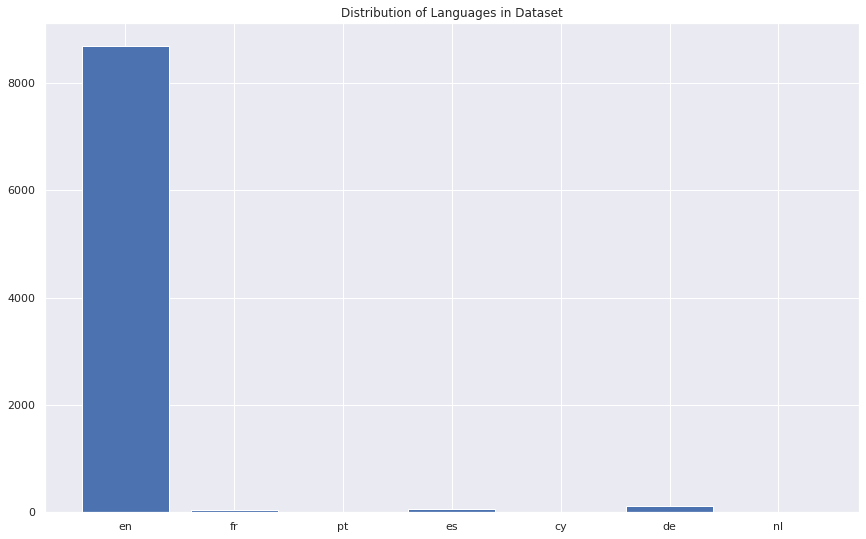

In [103]:
df['language'] = languages
plt.bar(range(len(languages_dict)), list(languages_dict.values()), align='center')
plt.xticks(range(len(languages_dict)), list(languages_dict.keys()))
plt.title("Distribution of Languages in Dataset")
plt.show()

In [104]:
#selecting only english language
df = df[df['language'] == 'en'] 
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8683 entries, 12081 to 3516
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   paper_id          8683 non-null   object
 1   doi               8683 non-null   object
 2   abstract          8683 non-null   object
 3   body_text         8683 non-null   object
 4   authors           8683 non-null   object
 5   title             8683 non-null   object
 6   journal           8683 non-null   object
 7   abstract_summary  8683 non-null   object
 8   language          8683 non-null   object
dtypes: object(9)
memory usage: 678.4+ KB


In [105]:
df.to_csv('final_data_10000.csv')

In [4]:
df = pd.read_csv('final_data_10000.csv')

In [5]:
df

,Unnamed: 0,paper_id,doi,abstract,body_text,authors,title,journal,abstract_summary,language
0,12081,3dc51c2b106b269bd45f6c632a69f8146b9184da,10.1186/s42077-021-00156-4,NaN,(APF) of at least 25 (may up to 1000) while N9...,"Srinivasan, Omprakash. Vijayakumar,<br>Vinod...",COVID-19 pandemic: choosing a loose-fitting<b...,Ain-Shams J Anesthesiol,Not provided.,en
1,4091,db0d3e520377229b22b38ee763bd9395c03af7e6,10.1523/eneuro.0077-20.2020,Alcohol (ethanol) use disorder is associated w...,exposure and long-term drinking influence plas...,"Cannady, Reginald. Nimitvilai-Roberts,<br>Su...",Distinct Region- and Time-Dependent<br>Functi...,eNeuro,Alcohol (ethanol) use disorder is associated<...,en
2,2348,c39fa76630136d508cdcb875442aaf77cc7fffce,10.1097/phh.0000000000001254,Healthy People 2030 describes a vision and off...,full potential for health and well-being acros...,"Pronk, Nico. Kleinman, Dushanka V.. Goekler...",Promoting Health and Well-being in Healthy<br...,J Public Health Manag Pract,Healthy People 2030 describes a vision and<br...,en
3,13098,f623f86fb07c7ec79b7f6444446859849e260192,10.1111/vcp.12241,Background: The DWBC (the ratio between DIFF a...,Feline infectious peritonitis (FIP) is an ubiq...,"Giordano, Alessia. Stranieri, Angelica. <br>...",High diagnostic accuracy of the Sysmex<br>XT‐...,Vet Clin Pathol,Background: The DWBC (the ratio between DIFF<...,en
4,10180,ce3a2ca6740586c547009739cd0e86bf9bd79a6c,10.1007/s00405-020-06112-6,Introduction The novel Coronavirus disease 201...,The novel Coronavirus disease 2019 (COVID-19) ...,"Piazza, Cesare. Filauro, Marta. Dikkers,<br...",Long-term intubation and high rate of<br>trac...,Eur Arch Otorhinolaryngol,Introduction The novel Coronavirus disease<br...,en
...,...,...,...,...,...,...,...,...,...,...
8678,727,01f05a8cb58797be6c77eff41788058c504d1e4c,10.1007/s40615-020-00934-0,Background Black patients are disproportionate...,COVID-19 disproportionately affects Black pati...,"Wiley, Zanthia. Kubes, Julianne N.. Cobb,<b...","Age, Comorbid Conditions, and Racial<br>Dispa...",J Racial Ethn Health Disparities,Background Black patients are<br>disproportio...,en
8679,4577,e7bbc724f071d3e8de12ac1fed8808b18ec0c9fb,10.3389/fmed.2020.573791,"Novel coronavirus disease , caused by SARS-CoV...","Delirium, a disorder characterized by confusio...","Han, Dong. Wang, Chenyang. Feng, Xiaojing. ...",Delirium During Recovery in Patients With<br>...,Front Med (Lausanne),"Novel coronavirus disease , caused by<br>SARS...",en
8680,9168,5d6b56b994abeef57920e10e0da77ce90ff9e446,10.1016/j.ijscr.2021.106225,NaN,Placenta Accreta Spectrum (PAS) can cause mass...,"Purwoto, Gatot. Surya, Ilham Utama. Saroyo,...",Massive obstetric haemorrhage on post<br>caes...,Int J Surg Case Rep,Not provided.,en
8681,9250,9a912ff5579d97c5ab2606422b5d4d77f71c3abf,10.1016/j.ejrad.2020.109431, Female gender and older age were risk factor...,severe acute respiratory syndrome coronavirus ...,"Akyurt, Nuran","Knowledge, practice and emotional status<br>r...",Eur J Radiol, Female gender and older age were risk facto...,en


In [6]:
#data preprocessing
def pre_processing(df, col):
    # convert the text to lowercase
    df[col] = df[col].str.lower()
    
    for i in range(len(df[col])):
        df[col][i] = re.sub("\n", " ", df[col][i])
    
        # replace Urls to URLADDR
        df[col][i] = re.sub("(?P<url>https?://[^\s]+)", " URLADDR ", df[col][i])
        # replace .co's/.com's to URLADDR
        df[col][i] = re.sub("[\S]+\.(net|com|org|info|edu|gov|uk|de|ca|jp|fr|au|us|ru|ch|it|nel|se|no|es|mil)[\S]*\s?",
                     " URLADDR ", df[col][i])
        # replace email addresses to EMAILADDR
        df[col][i] = re.sub("\S*@\S*\s?", " EMAILADDR ", df[col][i])
        # replace currency values to CURRENCY
        df[col][i] = re.sub("(?:[\£\$\€]{1}[,\d]+.?\d*)", " CURRENCY ", df[col][i])
        # replace numbers to NUMBER
        df[col][i] = re.sub("r[0-9]+", " NUMBER ", df[col][i])

        # remove html tags
        df[col][i] = re.sub('<[^>]+>','', df[col][i])

        # remove special characters and digits
        df[col][i] = re.sub('[^A-Za-z ]+', ' ', df[col][i])
    
    return df

In [7]:
df = pre_processing(df,"body_text")

In [8]:
punctuations = string.punctuation
stop_words = stopwords.words('english')

In [9]:
custom_stop_words = [
    'doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al', 'author', 'figure', 
    'rights', 'reserved', 'permission', 'used', 'using', 'biorxiv', 'medrxiv', 'license', 'fig', 'fig.', 
    'al.', 'Elsevier', 'PMC', 'CZI'
]

for w in custom_stop_words:
    if w not in stop_words:
        stop_words.append(w)

In [10]:
stop_words[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [11]:
def tokenizer_new(text):
    lemmatizer = WordNetLemmatizer()
    tokens = [word for word in nltk.word_tokenize(text)] 
    words = []
    for word in tokens:
        if word not in stop_words and word not in punctuations:
            words.append(word)

    lems = [lemmatizer.lemmatize(item,'v') for item in words]
    return lems

In [12]:
tqdm.pandas()
df["processed_text"] = df["body_text"].progress_apply(tokenizer_new)

100%|██████████| 8683/8683 [03:26<00:00, 41.99it/s]


In [13]:
vectorizer = TfidfVectorizer(stop_words = stop_words, tokenizer=tokenizer_new, lowercase=False, max_features=2**12)
X = vectorizer.fit_transform(df['body_text'])

### PCA clustering

In [14]:
pca = PCA(n_components=0.95, random_state=42)
X_reduced= pca.fit_transform(X.toarray())
X_reduced.shape

(8683, 2359)

In [16]:
# run kmeans with many different k
distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(2, 30)
for k in K:
    k_means = KMeans(n_clusters=k, random_state=42).fit(X_reduced)
    k_means.fit(X_reduced)
    distortions.append(sum(np.min(cdist(X_reduced, k_means.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])
    
    inertias.append(k_means.inertia_)
 
    mapping1[k] = sum(np.min(cdist(X_reduced, k_means.cluster_centers_,'euclidean'), axis=1)) / X.shape[0]
    mapping2[k] = k_means.inertia_
    #print('Found distortion for {} clusters'.format(k))

In [17]:
for key, val in mapping1.items():
    print(f'{key} : {val}')

2 : 0.9252406100522633
3 : 0.917316939726703
4 : 0.9131955882146372
5 : 0.9102783078868861
6 : 0.9072938040394674
7 : 0.9044569418249148
8 : 0.9032764699175179
9 : 0.9003714515381946
10 : 0.8984320296697856
11 : 0.8965364117250179
12 : 0.8949097549333362
13 : 0.8933456952679729
14 : 0.891699760349541
15 : 0.8906163033050662
16 : 0.8888189924315055
17 : 0.8879520265027272
18 : 0.8864483508990043
19 : 0.8858935761045962
20 : 0.884673556118904
21 : 0.8836609466209071
22 : 0.8822581922489492
23 : 0.8812416226859923
24 : 0.880562944600792
25 : 0.8795333519802796
26 : 0.8786910200064735
27 : 0.8781838050554809
28 : 0.8772321156021655
29 : 0.8761852183034398


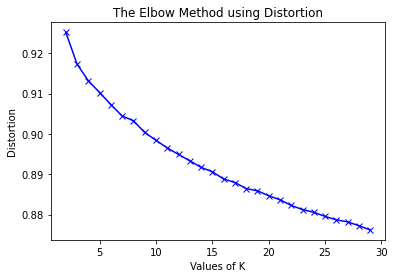

In [18]:
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

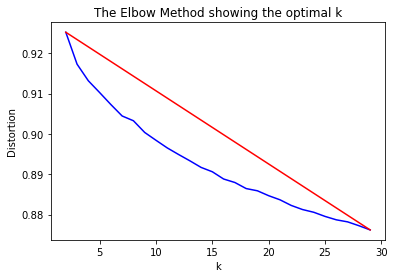

In [19]:
X_line = [K[0], K[-1]]
Y_line = [distortions[0], distortions[-1]]

# Plot the elbow
plt.plot(K, distortions, 'b-')
plt.plot(X_line, Y_line, 'r')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.02000492546677793
For n_clusters = 3 The average silhouette_score is : 0.01720861729575974
For n_clusters = 4 The average silhouette_score is : 0.013402839079139263
For n_clusters = 5 The average silhouette_score is : 0.013844969402902777
For n_clusters = 6 The average silhouette_score is : 0.014097304337884276
For n_clusters = 7 The average silhouette_score is : 0.015964379744315388
For n_clusters = 8 The average silhouette_score is : 0.014434128948018573
For n_clusters = 9 The average silhouette_score is : 0.01569830471044543
For n_clusters = 10 The average silhouette_score is : 0.016267189783613883
For n_clusters = 11 The average silhouette_score is : 0.017483636827779522
For n_clusters = 12 The average silhouette_score is : 0.0159160868768412
For n_clusters = 13 The average silhouette_score is : 0.015970946043352058
For n_clusters = 14 The average silhouette_score is : 0.016721639665039555
For n_clusters = 15 The average silhou

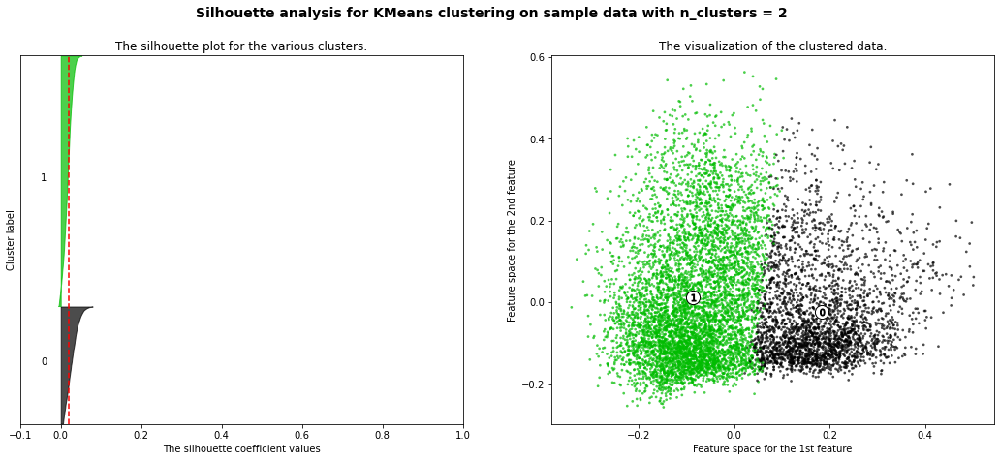

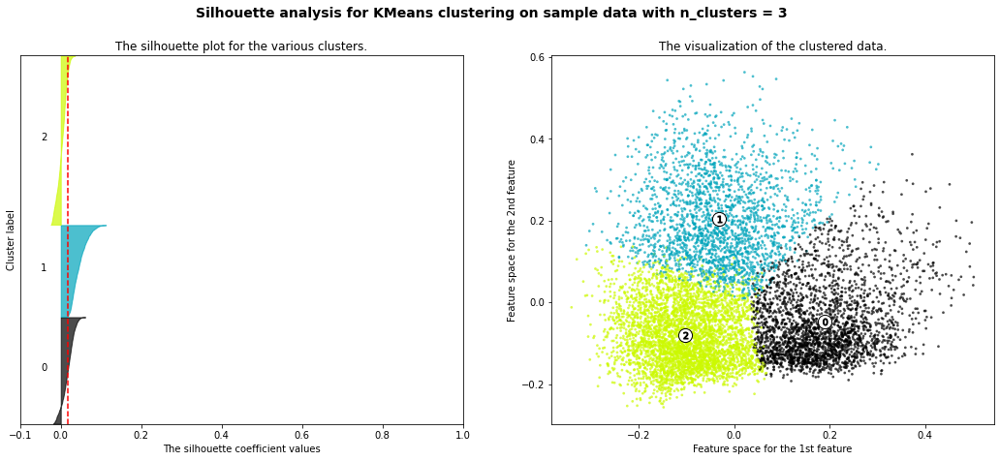

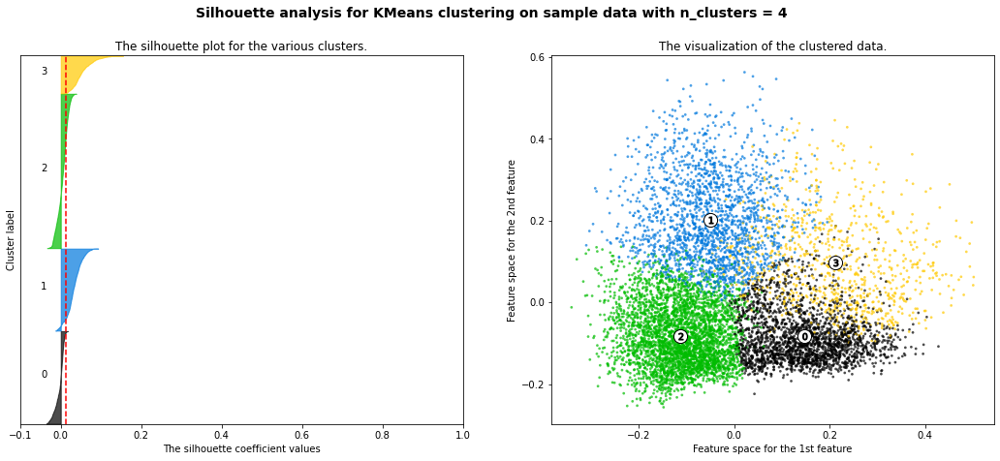

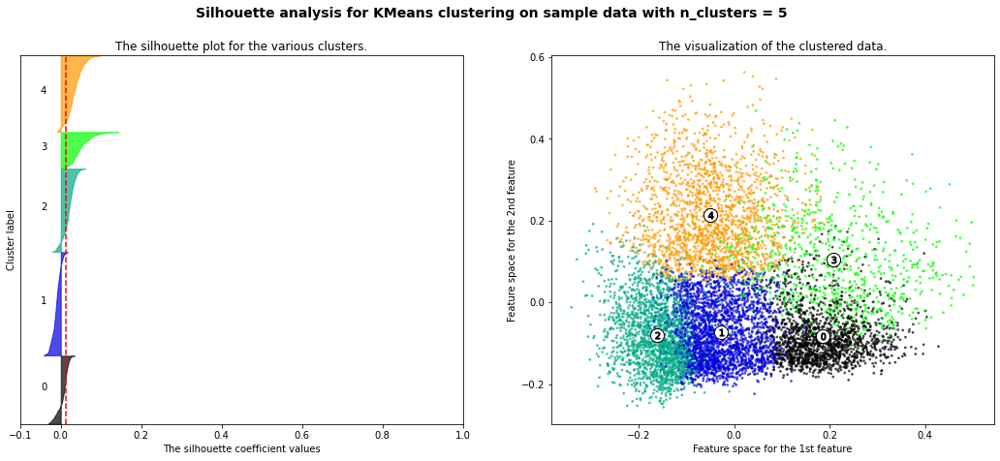

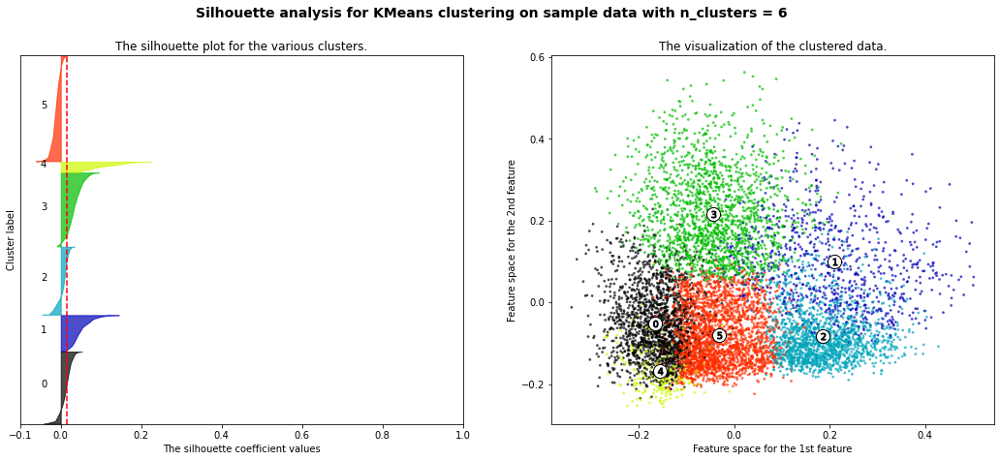

...

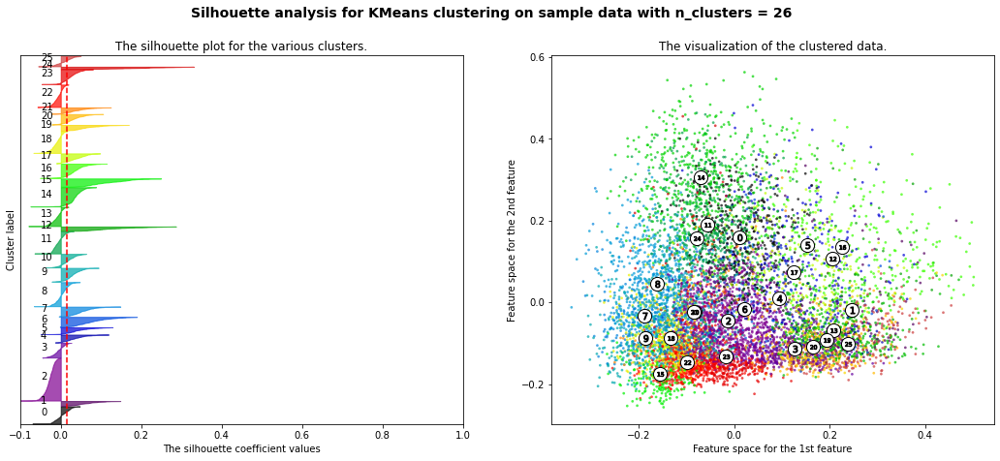

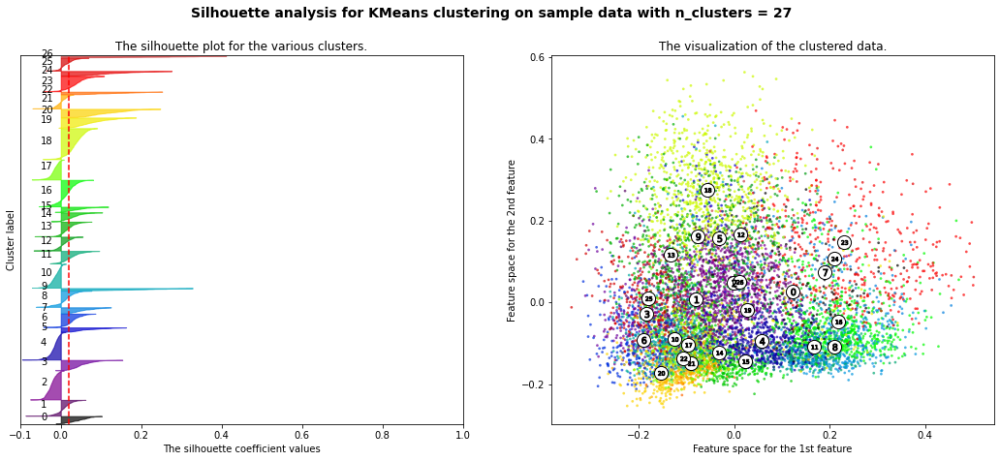

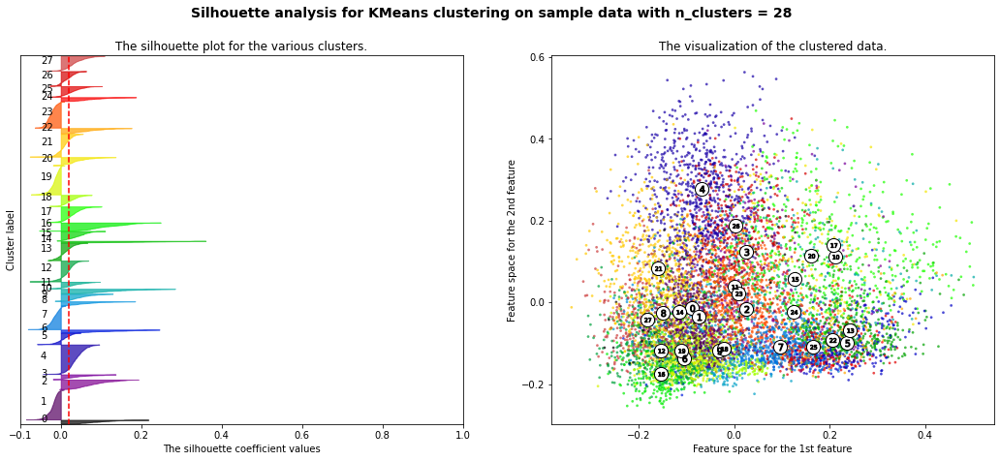

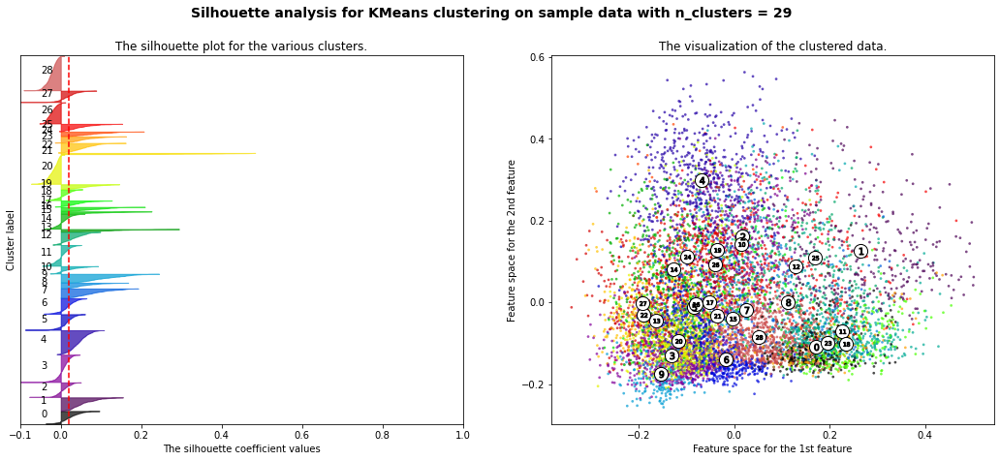

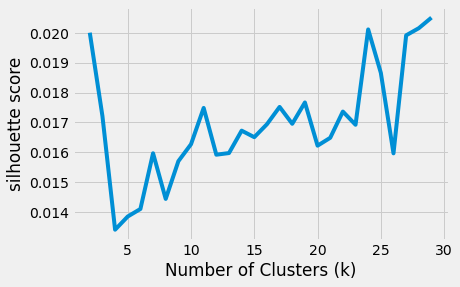

In [21]:
range_n_clusters = range(2, 30)
silhouette_avg_n_clusters = []

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X_reduced) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(X_reduced)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_reduced, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    silhouette_avg_n_clusters.append(silhouette_avg)
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_reduced, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_reduced[:, 0], X_reduced[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()


style.use("fivethirtyeight")
plt.plot(range_n_clusters, silhouette_avg_n_clusters)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("silhouette score")
plt.show()

In [23]:
K = range(2, 30)
sse, db, slc = {},{},{}
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    model = kmeans.fit_predict(X_reduced)
    if k == 3:
        labels = kmeans.labels_
    clusters = kmeans.labels_
    sse[k] = kmeans.inertia_
    db[k] = davies_bouldin_score(X_reduced, clusters)
    slc[k] = silhouette_score(X_reduced, clusters)

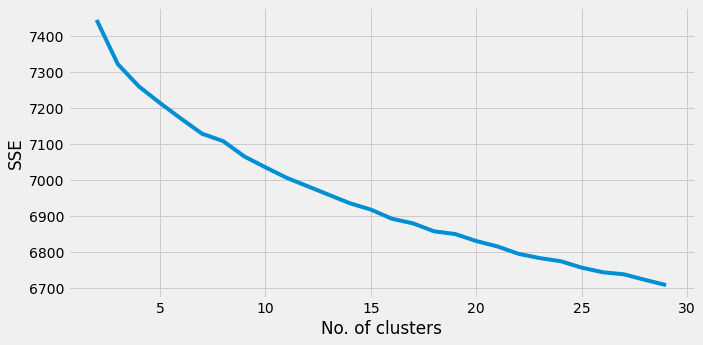

In [24]:
#elbow

plt.figure(figsize = (10,5))
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("No. of clusters")
plt.ylabel("SSE")
plt.show()

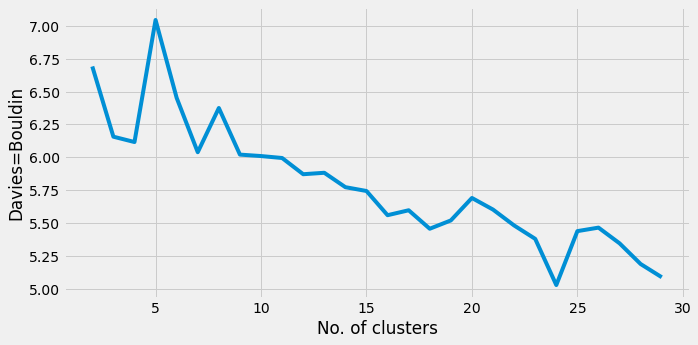

In [25]:
# davies-bouldin

plt.figure(figsize = (10,5))
plt.plot(list(db.keys()), list(db.values()))
plt.xlabel("No. of clusters")
plt.ylabel("Davies=Bouldin")
plt.show()

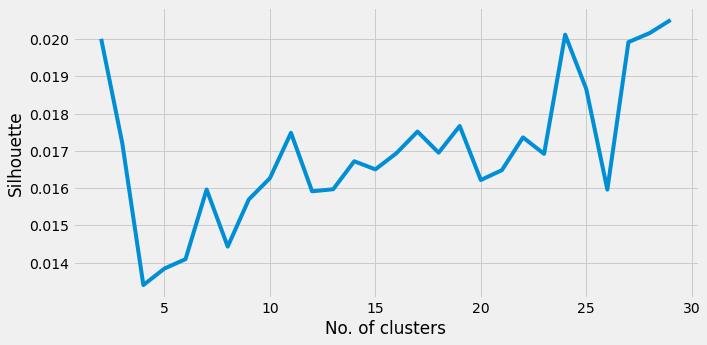

In [26]:
# silhouette

plt.figure(figsize = (10,5))
plt.plot(list(slc.keys()), list(slc.values()))
plt.xlabel("No. of clusters")
plt.ylabel("Silhouette")
plt.show()

In [27]:
k = 24
kmeans = KMeans(n_clusters=k, random_state=42)
y_pred = kmeans.fit_predict(X_reduced)
df['y'] = y_pred

In [28]:
tsne = TSNE(verbose=1, perplexity=50)  # Changed perplexity from 100 to 50 per FAQ
X_embedded = tsne.fit_transform(X.toarray())

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 8683 samples in 0.028s...
[t-SNE] Computed neighbors for 8683 samples in 5.505s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8683
[t-SNE] Computed conditional probabilities for sample 2000 / 8683
[t-SNE] Computed conditional probabilities for sample 3000 / 8683
[t-SNE] Computed conditional probabilities for sample 4000 / 8683
[t-SNE] Computed conditional probabilities for sample 5000 / 8683
[t-SNE] Computed conditional probabilities for sample 6000 / 8683
[t-SNE] Computed conditional probabilities for sample 7000 / 8683
[t-SNE] Computed conditional probabilities for sample 8000 / 8683
[t-SNE] Computed conditional probabilities for sample 8683 / 8683
[t-SNE] Mean sigma: 0.359130
[t-SNE] KL divergence after 250 iterations with early exaggeration: 108.459465
[t-SNE] KL divergence after 1000 iterations: 2.662679


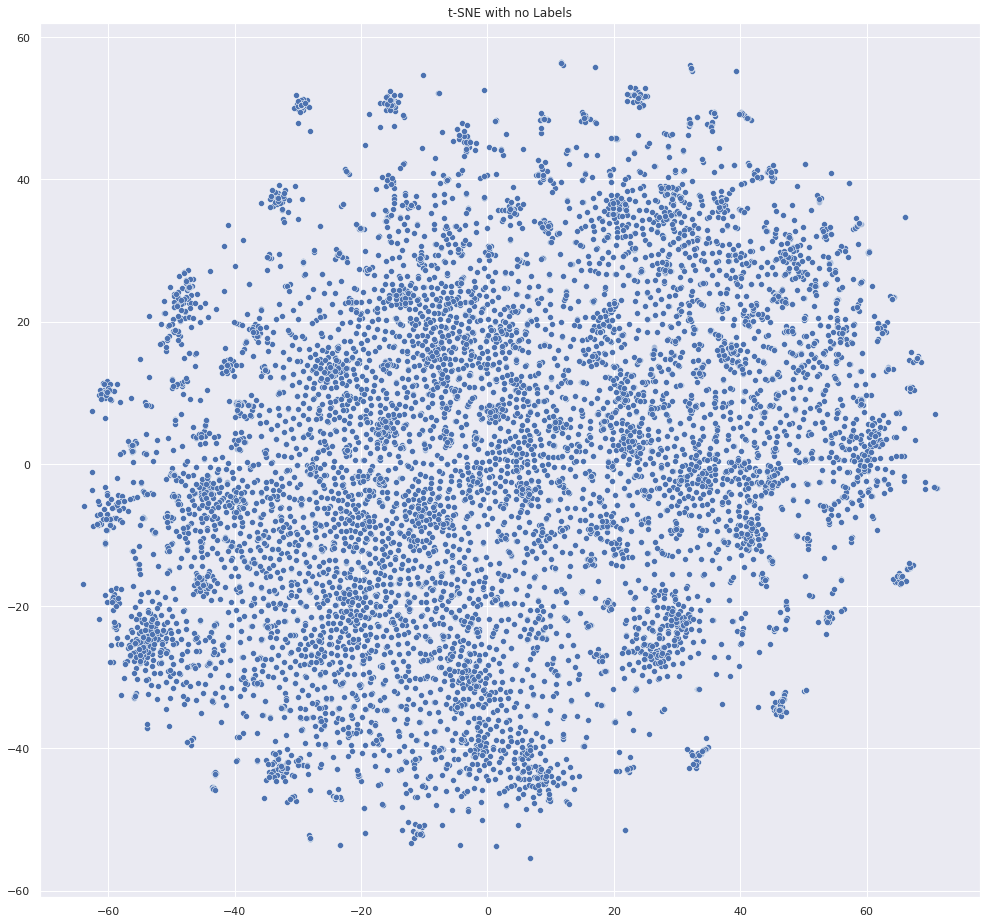

In [29]:
# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", 1)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], palette=palette)
plt.title('t-SNE with no Labels')
plt.savefig("t-sne_covid19.png")
plt.show()

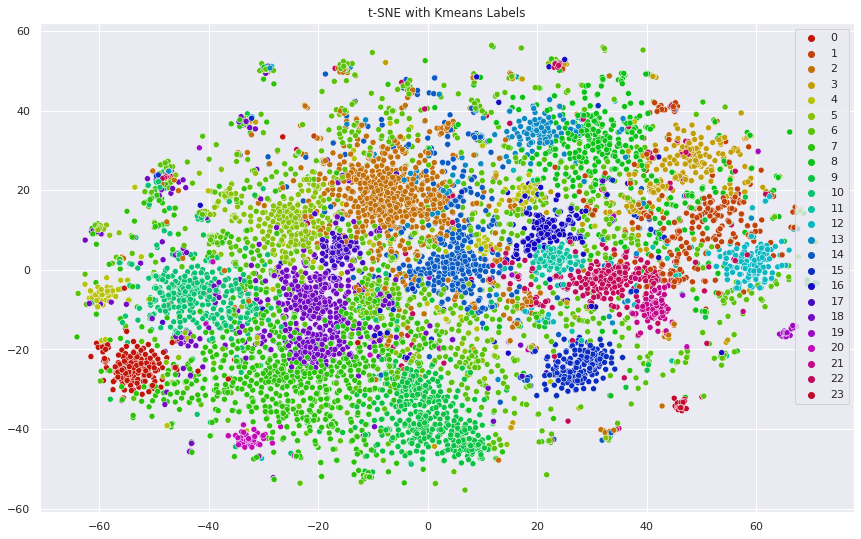

In [30]:
# sns settings
sns.set(rc={'figure.figsize':(13,9)})

# colors
palette = sns.hls_palette(k, l=.4, s=.9)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y_pred, legend='full', palette=palette)
plt.title('t-SNE with Kmeans Labels')
plt.savefig("improved_cluster_tsne.png")
plt.show()

In [32]:
vectorizers = []
    
for ii in range(0, k):
    # Creating a vectorizer
    vectorizers.append(CountVectorizer(lowercase=0))

In [33]:
vectorizers[0]

CountVectorizer(lowercase=0)

In [34]:
vectorized_data = []

for current_cluster, cvec in enumerate(vectorizers):
    vectorized_data.append(cvec.fit_transform(np.array(df.loc[df['y'] == current_cluster]['processed_text'])[current_cluster]))

In [35]:
len(vectorized_data)

24

In [36]:
# number of topics per cluster
NUM_TOPICS_PER_CLUSTER = k


lda_models = []

for ii in range(0, k):
    # Latent Dirichlet Allocation Model
    lda = LatentDirichletAllocation(n_components=NUM_TOPICS_PER_CLUSTER, max_iter=10, learning_method='online',verbose=False, random_state=42)
    lda_models.append(lda)
    
lda_models[0]

LatentDirichletAllocation(learning_method='online', n_components=24,
                          random_state=42, verbose=False)

In [37]:
clusters_lda_data = []

for current_cluster, lda in enumerate(lda_models):
    print("Current Cluster: " + str(current_cluster))
    
    if vectorized_data[current_cluster] != None:
        clusters_lda_data.append((lda.fit_transform(vectorized_data[current_cluster])))

Current Cluster: 0
Current Cluster: 1
Current Cluster: 2
Current Cluster: 3
Current Cluster: 4
Current Cluster: 5
Current Cluster: 6
Current Cluster: 7
Current Cluster: 8
Current Cluster: 9
Current Cluster: 10
Current Cluster: 11
Current Cluster: 12
Current Cluster: 13
Current Cluster: 14
Current Cluster: 15
Current Cluster: 16
Current Cluster: 17
Current Cluster: 18
Current Cluster: 19
Current Cluster: 20
Current Cluster: 21
Current Cluster: 22
Current Cluster: 23


In [38]:
# Functions for printing keywords for each topic
def selected_topics(model, vectorizer, top_n=10):
    current_words = []
    keywords = []
    
    for idx, topic in enumerate(model.components_):
        words = [(vectorizer.get_feature_names()[i], topic[i]) for i in topic.argsort()[:-top_n - 1:-1]]
        for word in words:
            if word[0] not in current_words:
                keywords.append(word)
                current_words.append(word[0])
                
    keywords.sort(key = lambda x: x[1])  
    keywords.reverse()
    return_values = []
    for ii in keywords:
        return_values.append(ii[0])
    return return_values

In [39]:
all_keywords = []
for current_vectorizer, lda in enumerate(lda_models):
    print("Current Cluster: " + str(current_vectorizer))

    if vectorized_data[current_vectorizer] != None:
        all_keywords.append(selected_topics(lda, vectorizers[current_vectorizer]))

Current Cluster: 0
Current Cluster: 1
Current Cluster: 2
Current Cluster: 3
Current Cluster: 4
Current Cluster: 5
Current Cluster: 6
Current Cluster: 7
Current Cluster: 8
Current Cluster: 9
Current Cluster: 10
Current Cluster: 11
Current Cluster: 12
Current Cluster: 13
Current Cluster: 14
Current Cluster: 15
Current Cluster: 16
Current Cluster: 17
Current Cluster: 18
Current Cluster: 19
Current Cluster: 20
Current Cluster: 21
Current Cluster: 22
Current Cluster: 23


In [40]:
all_keywords[0][:10]

['curriculum',
 'covid',
 'school',
 'community',
 'health',
 'catholic',
 'jitt',
 'information',
 'public',
 'students']

In [41]:
len(all_keywords)

24

In [42]:
f=open('topics.txt','w')

count = 0

for ii in all_keywords:

    if vectorized_data[count] != None:
        f.write(', '.join(ii) + "\n")
    else:
        f.write("Not enough instances to be determined. \n")
        f.write(', '.join(ii) + "\n")
    count += 1

f.close()

In [43]:
# save the COVID-19 DataFrame
pickle.dump(df, open("df_covid.p", "wb" ),0)

# save the final t-SNE
pickle.dump(X_embedded, open("X_embedded.p", "wb" ))

# save the labels generate with k-means(28)
pickle.dump(y_pred, open("y_pred.p", "wb" ))

### Visualization

In [44]:
! mkdir lib
! ls

mkdir: cannot create directory ‘lib’: File exists
archive.zip	      final_data.csv		       Untitled-Copy1.ipynb
call_backs.py	      improved_cluster_tsne.png        Untitled-Copy2.ipynb
data		      lib			       Untitled-Copy3.ipynb
data_tm.csv	      plot_text.py		       Untitled.ipynb
df_covid.p	      __pycache__		       X_embedded.p
final_data_10000.csv  topics.txt		       y_pred.p
final_data_3000.csv   t-sne_covid-19_interactive.html
final_data_5000.csv   t-sne_covid19.png


In [45]:
! wget https://raw.githubusercontent.com/MaksimEkin/COVID19-Literature-Clustering/master/lib/plot_text.py
! wget https://raw.githubusercontent.com/MaksimEkin/COVID19-Literature-Clustering/master/lib/call_backs.py
! mv plot_text.py lib/.
! mv call_backs.py lib/.
! ls lib/

wget: /shared/centos7/anaconda3/2021.05/lib/libuuid.so.1: no version information available (required by wget)
--2021-12-08 11:43:15--  https://raw.githubusercontent.com/MaksimEkin/COVID19-Literature-Clustering/master/lib/plot_text.py
Connecting to 10.99.0.130:3128... connected.
Proxy request sent, awaiting response... 200 OK
Length: 5703 (5.6K) [text/plain]
Saving to: ‘plot_text.py.1’

100%[======================================>] 5,703       --.-K/s   in 0s      

2021-12-08 11:43:15 (23.9 MB/s) - ‘plot_text.py.1’ saved [5703/5703]

wget: /shared/centos7/anaconda3/2021.05/lib/libuuid.so.1: no version information available (required by wget)
--2021-12-08 11:43:16--  https://raw.githubusercontent.com/MaksimEkin/COVID19-Literature-Clustering/master/lib/call_backs.py
Connecting to 10.99.0.130:3128... connected.
Proxy request sent, awaiting response... 200 OK
Length: 3188 (3.1K) [text/plain]
Saving to: ‘call_backs.py.1’

100%[======================================>] 3,188       --.-K/s   i

In [48]:
topic_path = os.path.join(os.getcwd(), 'topics.txt')
with open(topic_path) as f:
    topics = f.readlines()

In [49]:
# show on notebook
output_notebook()
# target labels
y_labels = y_pred

# data sources
source = ColumnDataSource(data=dict(
    x= X_embedded[:,0], 
    y= X_embedded[:,1],
    x_backup = X_embedded[:,0],
    y_backup = X_embedded[:,1],
    desc= y_labels, 
    titles= df['title'],
    authors = df['authors'],
    journal = df['journal'],
    abstract = df['abstract_summary'],
    labels = ["C-" + str(x) for x in y_labels],
    links = df['doi']
    ))

# hover over information
hover = HoverTool(tooltips=[
    ("Title", "@titles{safe}"),
    ("Author(s)", "@authors{safe}"),
    ("Journal", "@journal"),
    ("Abstract", "@abstract{safe}"),
    ("Link", "@links")
],
point_policy="follow_mouse")

# map colors
mapper = linear_cmap(field_name='desc', 
                     palette=Category20[20],
                     low=min(y_labels) ,high=max(y_labels))

# prepare the figure
plot = figure(plot_width=1200, plot_height=850, 
           tools=[hover, 'pan', 'wheel_zoom', 'box_zoom', 'reset', 'save', 'tap'], 
           title="Clustering of the COVID-19 Literature with t-SNE and K-Means", 
           toolbar_location="above")

# plot settings
plot.scatter('x', 'y', size=5, 
          source=source,
          fill_color=mapper,
          line_alpha=0.3,
          line_color="black",
          legend = 'labels')
plot.legend.background_fill_alpha = 0.6

Loading BokehJS ...

In [50]:
# Keywords
text_banner = Paragraph(text= 'Keywords: Slide to specific cluster to see the keywords.', height=25)
input_callback_1 = input_callback(plot, source, text_banner, topics)

# currently selected article
div_curr = Div(text="""Click on a plot to see the link to the article.""",height=150)
callback_selected = CustomJS(args=dict(source=source, current_selection=div_curr), code=selected_code())
taptool = plot.select(type=TapTool)
taptool.callback = callback_selected

# WIDGETS
slider = Slider(start=0, end=20, value=24, step=1, title="Cluster #")
keyword = TextInput(title="Search:")

# pass call back arguments
input_callback_1.args["text"] = keyword
input_callback_1.args["slider"] = slider
# column(,,widgetbox(keyword),,widgetbox(slider),, notes, cite, cite2, cite3), plot

In [56]:
# STYLE
header.sizing_mode = "stretch_width"
header.style={'color': '#2e484c', 'font-family': 'Julius Sans One, sans-serif;'}
header.margin=5

description.style ={'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
description.sizing_mode = "stretch_width"
description.margin = 5

description2.sizing_mode = "stretch_width"
description2.style ={'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
description2.margin=10

description_slider.style ={'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
description_slider.sizing_mode = "stretch_width"

description_search.style ={'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
description_search.sizing_mode = "stretch_width"
description_search.margin = 5

slider.sizing_mode = "stretch_width"
slider.margin=15

keyword.sizing_mode = "scale_both"
keyword.margin=15

div_curr.style={'color': '#BF0A30', 'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
div_curr.sizing_mode = "scale_both"
div_curr.margin = 24

text_banner.style={'color': '#0269A4', 'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
text_banner.sizing_mode = "stretch_width"
text_banner.margin = 24

plot.sizing_mode = "scale_both"
plot.margin = 5

dataset_description.sizing_mode = "stretch_width"
dataset_description.style ={'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
dataset_description.margin=10

notes.sizing_mode = "stretch_width"
notes.style ={'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
notes.margin=10

cite.sizing_mode = "stretch_width"
cite.style ={'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
cite.margin=10

r = row(div_curr,text_banner)
r.sizing_mode = "stretch_width"

In [57]:
# LAYOUT OF THE PAGE
l = layout([
#     [header],
#     [description],
#     [description_slider, description_search],
    [slider, keyword],
#     [text_banner],
#     [div_curr],
    [plot],
#     [description2, dataset_description, notes, cite],
])
l.sizing_mode = "scale_both"


# show
output_file('t-sne_covid-19_interactive.html')
show(l)